# Importações e Bibliotecas

In [1]:
import random # Operações de aleatoriedade
import sys # Operações do sistema (print, etc)
import statistics # Operações de estatística

In [2]:
from market import Market, Produto # Importa a classe Market e a classe Produto

In [3]:
# Importações para construção gráfica do melhor indivíduo e do gráfico de evolução
from PIL import Image
from IPython.display import display
import plotly.graph_objects as go

# Valores Estáticos

In [4]:
CART: dict = {
    'Altura': 65,
    'Largura': 50,
    'Comprimento': 80,
    'PesoMaximo': 460*1000
}
CART['Capacidade'] = CART['Altura'] * CART['Largura'] * CART['Comprimento']

CART

{'Altura': 65,
 'Largura': 50,
 'Comprimento': 80,
 'PesoMaximo': 460000,
 'Capacidade': 260000}

In [5]:
MAX_MONEY: float = 1750.0
MAX_ITEMS: int = 100
MAX_CARTS: int = 150
MAX_GENERATIONS: int = 4000
BESTS: int = 2

In [6]:
MED_PRICE: float = MAX_MONEY/MAX_ITEMS
f"Preço Médio por Produto: R${MED_PRICE:.2f}"

'Preço Médio por Produto: R$17.50'

# Funções

In [7]:
m: Market = Market(r"..\data\produtos2.csv")
print(m)

Market Info
8465 products loaded.


In [8]:
def mosaic(cart: list[Produto], row_quantity: int = 5, image_size: tuple[int, int] = (300, 300)) -> None:
    """Cria um mosaico com as imagens dos produtos do carrinho"""
    
    # Lista o objeto das imagens
    images: list[Image] = [product.show(popup=False).resize(image_size) for product in cart]
    
    # Calcula o tamanho do mosaico
    mosaic_size: tuple[int, int] = (image_size[0]*row_quantity, image_size[1]*((len(images)//row_quantity)+1))
    
    # Cria a imagem do mosaico
    mosaic: Image = Image.new('RGB', mosaic_size)
    
    # Coloca as imagens no mosaico
    for i, image in enumerate(images):
        mosaic.paste(image, (image_size[0]*(i%row_quantity), image_size[1]*(i//row_quantity)))
    
    # Exibe o mosaico
    display(mosaic) 

In [9]:
def plot_generations(data: dict[int, dict[str, float]]) -> None:
    """Plota um gráfico com os valores de cada geração"""
    
    # Extrai as iterações e os valores
    iterations: list = list(data.keys())
    max_values: list = [data[i]['max'] for i in iterations]
    min_values: list = [data[i]['min'] for i in iterations]
    avg_values: list = [data[i]['med'] for i in iterations]

    # Cria o objeto gráfico
    fig = go.Figure()

    # Adiciona as linhas para cada variável
    fig.add_trace(go.Scatter(x=iterations, y=max_values, mode='lines+markers', name='Max', line=dict(color="#a90000")))
    fig.add_trace(go.Scatter(x=iterations, y=min_values, mode='lines+markers', name='Min', line=dict(color="#007d1d")))
    fig.add_trace(go.Scatter(x=iterations, y=avg_values, mode='lines+markers', name='Medio', line=dict(color="#356fa8")))

    # Adiciona título e rótulos
    fig.update_layout(
                    title='Gráfico de Gerações',
                    xaxis_title='Iteração',
                    yaxis_title='Valores',
                    yaxis_type='log',  #! Define o eixo y como logarítmico
                    template='plotly'
                )

    # Exibe o gráfico
    fig.show()

In [10]:
def calculate_regression(data: dict, last: int = globals()['MAX_GENERATIONS']//5) -> float:
    """ Calcula a regressão linear dos valores de uma lista de gerações das últimas N gerações """
    
    # Se a quantidade de dados for menor que o mínimo, retorna infinito
    if len(data) < last:
        return float("inf")
    
    else:
        values: list = list(data.values())[-last:]
        return statistics.stdev([value.get('min') for value in values])

In [11]:
def instanciate(cart: list[int]) -> list[Produto]:
    """Instancia uma lista de produtos a partir de uma lista de IDs"""
    
    return [m.get(i) for i in cart]

In [12]:
def info(cart: list[int]) -> str:
    """ Retorna uma string com as informações do indivíduo/carrinho """
    nota: float = avaliar(cart)
    cart: list[Produto] = instanciate(cart)
    return f"[INDIVÍDUO]\n\
Nota: {nota}\n\
Tamanho: {len(cart)}\n\n\
[INFORMAÇÕES DO CARRINHO]\n\
Preço Total: R${sum([product.price for product in cart]):.2f}\n\
Peso Total: {sum([product.weight for product in cart])/1000:.2f}g\n\
Volume Total: {sum([product.volume for product in cart]):.2f}cm³\n\
Preço médio: R${sum([product.price for product in cart])/len(cart)}\n\n\
[PRODUTOS]\n\
Menor preço: R${min([product.price for product in cart])}\n\
Maior preço: R${max([product.price for product in cart])}\n\
Menor peso: {min([product.weight for product in cart])}g\n\
Maior peso: {max([product.weight for product in cart])}g\n\
Menor volume: {min([product.volume for product in cart])}cm³\n\
Maior volume: {max([product.volume for product in cart])}cm³\n\n\
[CATEGORIAS]:\n{"\n".join([f"- {category}: {[product.category for product in cart].count(category)}" for category in set([product.category for product in cart])])}\n\n\
[LISTAGEM]\n{"\n".join([f"{product.name} \t R${product.price:.2f} \t {product.weight:.2f}g \t {product.volume:.2f}cm³" for product in cart])}\n\
"

# Genético

### Geração de Indivíduos

In [13]:
def gerar_carrinho(tamanho: int = globals()['MAX_ITEMS']) -> list[int]:
    compra = []

    while len(compra) < tamanho:
        item: int = m.random()
        compra.append(item)
        
    return compra

In [14]:
c: list[int] = gerar_carrinho()
c

[355821,
 324113,
 652269,
 309651,
 142048,
 160361,
 478109,
 1529610,
 428829,
 171251,
 1446539,
 459994,
 653608,
 448084,
 81517,
 9493,
 316067,
 1619360,
 76987,
 1617341,
 1616750,
 1595867,
 469503,
 1615221,
 1070273,
 128012,
 190928,
 1548201,
 498809,
 695252,
 24746,
 462032,
 132659,
 1075825,
 146389,
 1616491,
 438269,
 478016,
 441808,
 477252,
 1613312,
 219413,
 1435088,
 658731,
 181551,
 409167,
 346267,
 136426,
 122737,
 1625177,
 34711,
 120102,
 70782,
 1571633,
 458942,
 1385623,
 95055,
 1614866,
 1607311,
 1619035,
 1253131,
 1619338,
 1545259,
 69678,
 199663,
 1618480,
 1624516,
 46406,
 1614413,
 1065155,
 452970,
 1609526,
 278514,
 472069,
 456199,
 87092,
 120342,
 458942,
 143103,
 180933,
 1536217,
 1617348,
 459333,
 472666,
 1616322,
 1584473,
 60587,
 30303,
 71969,
 32710,
 421972,
 470012,
 481177,
 391437,
 439977,
 223940,
 1376300,
 48213,
 1407884,
 592307]

### Geração de População Inicial

In [15]:
def gerar_populacao(tamanho: int = globals()['MAX_CARTS']) -> list[list[int]]:
    return [gerar_carrinho() for _ in range(tamanho)]

In [16]:
p: list[list[int]] = gerar_populacao()
p

[[455609,
  345290,
  152328,
  328356,
  144659,
  410481,
  1518860,
  1571956,
  183352,
  632091,
  174936,
  1572645,
  695375,
  410974,
  1623277,
  425249,
  264250,
  328034,
  1574777,
  1600786,
  15175,
  1623448,
  302990,
  165471,
  381469,
  14426,
  73447,
  481483,
  1615398,
  1614229,
  596258,
  1574778,
  1386453,
  460412,
  443469,
  263298,
  424338,
  692004,
  423598,
  342387,
  1446562,
  146240,
  613993,
  431996,
  169902,
  1616604,
  175567,
  348824,
  459933,
  335965,
  356766,
  62352,
  1588958,
  1606436,
  454499,
  1613311,
  160390,
  106366,
  412752,
  1243541,
  116340,
  146266,
  408759,
  1572798,
  334112,
  279929,
  1059414,
  1450075,
  1307781,
  331897,
  428327,
  345212,
  467539,
  1602733,
  391726,
  1602733,
  477546,
  77403,
  1578359,
  1602373,
  331470,
  1433061,
  416086,
  466055,
  9965,
  1535835,
  218951,
  152169,
  1591454,
  807905,
  83818,
  441614,
  796033,
  426617,
  1538468,
  1341702,
  176313,
  161898

### Avaliação

In [17]:
def avaliar(individuo: list[int]) -> float:
    valor_total: float = 0.0
    peso_total: float = 0.0
    volume_total: float = 0.0
    repeticoes: int = 0
    categorias: list = []
    
    pesos = {
        'essencial': 0.9,
        'alimentos': 0.85,
        'açougue': 0.9,
        'beleza-e-perfumaria': 0.55,
        'bebidas': 0.6, 
        'bebidas-alcoolicas': 0.3,
        'bebidas-alcoolicas-': 0.3,
        'limpeza': 0.4,
        'cuidados-pessoais': 0.55 
    }
    
    for id in individuo:
        produto = m.get(id)
        volume_total+=produto.volume
        peso_total+=produto.weight
        valor_total+=produto.price
        categorias.append(produto.category)
        r=individuo.count(id)
        repeticoes+=(r*2) if r > 1 else 0
        
    # nota = valor_total**2
    # nota = globals()['MAX_MONEY']
    nota = 100
    
    # Ônus
    nota*= max(1, volume_total - globals()['CART']['Capacidade'])
    nota*= max(1, peso_total - globals()['CART']['PesoMaximo'])
    nota*= max(1, valor_total - globals()['MAX_MONEY'])
    nota*= max(1, repeticoes)

    # Bônus
    nota/= len(set(categorias))
    nota*= sum([pesos[c]**categorias.count(c) for c in set(categorias)])
    

    return nota**2 


In [18]:
n: float = avaliar(c)
n

11010234432.880209

In [19]:
def mapear_notas(populacao: list[list[int]], order: str = 'asc') -> dict[float, list[int]]:
    notas: dict = {avaliar(individuo): individuo for individuo in populacao}
    
    if order == 'asc':
        return dict(sorted(notas.items()))
    
    else:
        return dict(sorted(notas.items(), reverse=True))

In [20]:
nt: dict[float, list[int]] = mapear_notas(p)
nt

{57.92851276225224: [643619,
  472428,
  438271,
  622943,
  1538481,
  310907,
  419243,
  1614240,
  1619087,
  658413,
  384522,
  1568079,
  409398,
  1607693,
  1376422,
  458763,
  401855,
  409974,
  1616728,
  426756,
  328298,
  1602794,
  391423,
  1584211,
  117155,
  462500,
  1253480,
  1313560,
  670154,
  433820,
  1551449,
  466100,
  159760,
  1378032,
  1602851,
  107838,
  303656,
  93818,
  396722,
  321979,
  1446161,
  693819,
  1496552,
  465035,
  452604,
  6455,
  440604,
  409577,
  1452962,
  331441,
  155636,
  1618833,
  331474,
  466310,
  323714,
  156940,
  1619331,
  40386,
  1468915,
  50866,
  309481,
  1602370,
  1542454,
  439932,
  1616714,
  472668,
  1556440,
  432723,
  271085,
  1592463,
  321063,
  1623299,
  1617704,
  622836,
  444038,
  454666,
  142277,
  88879,
  760270,
  139908,
  97186,
  56342,
  539627,
  1614973,
  718717,
  174178,
  107047,
  404860,
  459287,
  1591465,
  1624286,
  1614065,
  395577,
  1617338,
  9112,
  178710,

### Seleção

In [21]:
def torneio(populacao: list[list[int]]) -> list[list[int]]:
    vencedores: list[list[int] | None] = []
    
    while len(vencedores) < 2:
        competidores: list[list[int]] = random.sample(populacao, 2)
        
        if avaliar(competidores[0]) < avaliar(competidores[1]):
            vencedor: list[int] = competidores[0]
        
        else:
            vencedor: list[int] = competidores[1]             

        if vencedor not in vencedores:    
            vencedores.append(vencedor)
    
    return vencedores

In [22]:
v1: list[list[int]] = torneio(p)
v1

[[1619101,
  1616765,
  493186,
  433026,
  1624046,
  74229,
  416468,
  1615272,
  10788,
  451033,
  37415,
  512747,
  1578860,
  658412,
  115217,
  622038,
  1616319,
  327509,
  462213,
  51189,
  155197,
  71812,
  73673,
  1613997,
  117874,
  1578350,
  393617,
  461334,
  174670,
  410987,
  115182,
  448858,
  512751,
  310573,
  1376041,
  5639,
  438896,
  984021,
  447652,
  905702,
  508298,
  1105263,
  402522,
  796031,
  97821,
  129701,
  695237,
  479470,
  1570314,
  472078,
  347327,
  362357,
  709893,
  445965,
  91391,
  87396,
  1618907,
  56805,
  159743,
  1404624,
  433106,
  1616061,
  1616046,
  94682,
  338584,
  117446,
  1466985,
  403667,
  1121874,
  22786,
  1618582,
  1376290,
  343833,
  132023,
  1551011,
  424196,
  94589,
  214074,
  1619269,
  48213,
  180933,
  1073063,
  119646,
  1567345,
  327412,
  561876,
  223475,
  137858,
  221979,
  1313578,
  155964,
  421082,
  440388,
  62071,
  324051,
  1387087,
  237912,
  166476,
  62147,
  1

In [23]:
def roleta_viciada(populacao: list[list[int]]) -> list[list[int]]:
    fitness_list: list[float] = [1 / avaliar(individuo) for individuo in populacao]
    total_fitness: float = sum(fitness_list)
    probabilities: list[float] = [fitness / total_fitness for fitness in fitness_list]
    
    vencedores: list[list[int]] = random.choices(populacao, weights=probabilities, k=2)
    
    return vencedores

In [24]:
v2: list[list[int]] = roleta_viciada(p)
v2

[[643619,
  472428,
  438271,
  622943,
  1538481,
  310907,
  419243,
  1614240,
  1619087,
  658413,
  384522,
  1568079,
  409398,
  1607693,
  1376422,
  458763,
  401855,
  409974,
  1616728,
  426756,
  328298,
  1602794,
  391423,
  1584211,
  117155,
  462500,
  1253480,
  1313560,
  670154,
  433820,
  1551449,
  466100,
  159760,
  1378032,
  1602851,
  107838,
  303656,
  93818,
  396722,
  321979,
  1446161,
  693819,
  1496552,
  465035,
  452604,
  6455,
  440604,
  409577,
  1452962,
  331441,
  155636,
  1618833,
  331474,
  466310,
  323714,
  156940,
  1619331,
  40386,
  1468915,
  50866,
  309481,
  1602370,
  1542454,
  439932,
  1616714,
  472668,
  1556440,
  432723,
  271085,
  1592463,
  321063,
  1623299,
  1617704,
  622836,
  444038,
  454666,
  142277,
  88879,
  760270,
  139908,
  97186,
  56342,
  539627,
  1614973,
  718717,
  174178,
  107047,
  404860,
  459287,
  1591465,
  1624286,
  1614065,
  395577,
  1617338,
  9112,
  178710,
  649498,
  144036

In [25]:
def eugenia(populacao: list[list[int]], order: str = 'asc') -> list[list[int]]:
    notas: dict[float, list[int]] = mapear_notas(populacao, order)
    melhores: list[list[int]] = list(notas.values())[:globals()['BESTS']]
    
    return melhores

In [26]:
e: list[list[int]] = eugenia(p)
e

[[643619,
  472428,
  438271,
  622943,
  1538481,
  310907,
  419243,
  1614240,
  1619087,
  658413,
  384522,
  1568079,
  409398,
  1607693,
  1376422,
  458763,
  401855,
  409974,
  1616728,
  426756,
  328298,
  1602794,
  391423,
  1584211,
  117155,
  462500,
  1253480,
  1313560,
  670154,
  433820,
  1551449,
  466100,
  159760,
  1378032,
  1602851,
  107838,
  303656,
  93818,
  396722,
  321979,
  1446161,
  693819,
  1496552,
  465035,
  452604,
  6455,
  440604,
  409577,
  1452962,
  331441,
  155636,
  1618833,
  331474,
  466310,
  323714,
  156940,
  1619331,
  40386,
  1468915,
  50866,
  309481,
  1602370,
  1542454,
  439932,
  1616714,
  472668,
  1556440,
  432723,
  271085,
  1592463,
  321063,
  1623299,
  1617704,
  622836,
  444038,
  454666,
  142277,
  88879,
  760270,
  139908,
  97186,
  56342,
  539627,
  1614973,
  718717,
  174178,
  107047,
  404860,
  459287,
  1591465,
  1624286,
  1614065,
  395577,
  1617338,
  9112,
  178710,
  649498,
  144036

### Crossover e Mutação

In [27]:
def cruzamento(pais: list[list[int]], chance: float = 0.80, num_pontos_corte: int = 3) -> list[list[int]]:
    pai_1: list[int] = pais[0]
    pai_2: list[int] = pais[1]

    probabilidade: float = round(random.uniform(0, 1), 2)
    if probabilidade < chance:
        pontos_corte: list[int] = sorted(random.sample(range(1, len(pai_1)), num_pontos_corte))

        filho_1: list[int | None] = []
        filho_2: list[int | None] = []

        pos_inicio: int = 0
        for i in range(num_pontos_corte):
            pos_fim = pontos_corte[i]
            filho_1 += pai_1[pos_inicio:pos_fim] if i % 2 == 0 else pai_2[pos_inicio:pos_fim]
            filho_2 += pai_2[pos_inicio:pos_fim] if i % 2 == 0 else pai_1[pos_inicio:pos_fim]
            pos_inicio = pos_fim

        # Adicionando a parte restante do genoma após o último ponto de corte
        filho_1 += pai_2[pos_inicio:]
        filho_2 += pai_1[pos_inicio:]

        return [filho_1, filho_2]

    else:
        return [pai_1, pai_2]

In [28]:
f: list[list[int]] = cruzamento(v1)
f

[[1619101,
  1616765,
  493186,
  433026,
  1624046,
  74229,
  416468,
  1615272,
  10788,
  451033,
  37415,
  512747,
  1578860,
  658412,
  115217,
  622038,
  1616319,
  327509,
  462213,
  51189,
  155197,
  71812,
  73673,
  1613997,
  117874,
  1578350,
  393617,
  461334,
  174670,
  410987,
  115182,
  448858,
  512751,
  310573,
  1376041,
  5639,
  438896,
  984021,
  447652,
  905702,
  508298,
  1105263,
  402522,
  796031,
  97821,
  642767,
  1623544,
  95963,
  442120,
  472078,
  347327,
  362357,
  709893,
  445965,
  91391,
  87396,
  1618907,
  56805,
  159743,
  1404624,
  433106,
  1616061,
  1616046,
  94682,
  338584,
  117446,
  1466985,
  403667,
  1121874,
  22786,
  1618582,
  1376290,
  343833,
  132023,
  1551011,
  424196,
  94589,
  214074,
  1619269,
  48213,
  180933,
  1073063,
  119646,
  1567345,
  327412,
  561876,
  223475,
  137858,
  221979,
  1313578,
  155964,
  327686,
  190928,
  280699,
  1083528,
  1446162,
  75560,
  15428,
  284066,
  7

In [29]:
def mutar(populacao: list[list[int]], chance = 0.03) -> list[list[int]]: 
    mutados: list[list[int]] = []

    for individuo in populacao:
        for pos, alelo in enumerate(individuo):
            mutacao: float = round(random.uniform(0, 1), 3)

            if mutacao < chance:
                novo_gene: str = m.random(ignore_case=[alelo,]) 
                individuo: str = individuo[:pos] + [novo_gene] + individuo[pos+1:]

        mutados.append(individuo)
    
    return mutados

In [30]:
mt: list[list[Produto]] = mutar(f)
mt

[[1619101,
  1616765,
  493186,
  433026,
  1624046,
  749592,
  416468,
  1615272,
  10788,
  451033,
  37415,
  512747,
  1578860,
  658412,
  115217,
  622038,
  1616319,
  327509,
  462213,
  51189,
  155197,
  71812,
  73673,
  1613997,
  117874,
  1578350,
  393617,
  461334,
  174670,
  410987,
  115182,
  448858,
  512751,
  310573,
  1376041,
  5639,
  438896,
  984021,
  447652,
  905702,
  508298,
  1105263,
  402522,
  131345,
  97821,
  642767,
  1623544,
  95963,
  442120,
  472078,
  347327,
  362357,
  709893,
  445965,
  91391,
  87396,
  1618907,
  56805,
  159743,
  1404624,
  433106,
  1616061,
  1616046,
  94682,
  411485,
  117446,
  1466985,
  403667,
  1121874,
  22786,
  1618582,
  428796,
  343833,
  132023,
  1551011,
  424196,
  94589,
  214074,
  1619269,
  48213,
  180933,
  1073063,
  119646,
  1567345,
  327412,
  561876,
  223475,
  137858,
  221979,
  1313578,
  155964,
  327686,
  190928,
  280699,
  1083528,
  1446162,
  75560,
  15428,
  284066,
  7

# Execução Principal

In [31]:
relatorio: dict[dict[str: float]] = {}

In [32]:
if __name__ == '__main__':
    i: int = 1
    populacao_atual: list[list[int]] = gerar_populacao()
    notas: list[float | None] = list(mapear_notas(populacao_atual).keys())
    
    while (i <= MAX_GENERATIONS) and (calculate_regression(relatorio) >= 1) and (0 not in notas):
        geracao: list[list[int]] = []
        
        while len(geracao) < (MAX_CARTS - BESTS):
            pais: list[list[int]] = torneio(populacao_atual)
            # pais: list[list[int]] = roleta_viciada(populacao_atual)
            
            filhos: list[list[int]] = mutar(cruzamento(pais))
            geracao.extend(filhos)
            
        geracao.extend(eugenia(populacao_atual))
        
        populacao_atual: list[list[int]] = geracao.copy()
        notas: list[float] = list(mapear_notas(populacao_atual).keys())
        relatorio[i] = {'max': max(notas), 'min': min(notas), 'med': statistics.median(notas)}
        sys.stdout.write(f'\rGeração: {i}\n')
        i+=1

Geração: 1
Geração: 2
Geração: 3
Geração: 4
Geração: 5
Geração: 6
Geração: 7
Geração: 8
Geração: 9
Geração: 10
Geração: 11
Geração: 12
Geração: 13
Geração: 14
Geração: 15
Geração: 16
Geração: 17
Geração: 18
Geração: 19
Geração: 20
Geração: 21
Geração: 22
Geração: 23
Geração: 24
Geração: 25
Geração: 26
Geração: 27
Geração: 28
Geração: 29
Geração: 30
Geração: 31
Geração: 32
Geração: 33
Geração: 34
Geração: 35
Geração: 36
Geração: 37
Geração: 38
Geração: 39
Geração: 40
Geração: 41
Geração: 42
Geração: 43
Geração: 44
Geração: 45
Geração: 46
Geração: 47
Geração: 48
Geração: 49
Geração: 50
Geração: 51
Geração: 52
Geração: 53
Geração: 54
Geração: 55
Geração: 56
Geração: 57
Geração: 58
Geração: 59
Geração: 60
Geração: 61
Geração: 62
Geração: 63
Geração: 64
Geração: 65
Geração: 66
Geração: 67
Geração: 68
Geração: 69
Geração: 70
Geração: 71
Geração: 72
Geração: 73
Geração: 74
Geração: 75
Geração: 76
Geração: 77
Geração: 78
Geração: 79
Geração: 80
Geração: 81
Geração: 82
Geração: 83
Geração: 84
G

In [33]:
for gen, data in relatorio.items():
    print(f'Geração: {gen} - {data}')

Geração: 1 - {'max': 2.102580064359146e+30, 'min': 105.39894863897278, 'med': 591035945.9355845}
Geração: 2 - {'max': 8.615158599498963e+20, 'min': 105.39894863897278, 'med': 152639190.40582123}
Geração: 3 - {'max': 3.113763113336343e+17, 'min': 105.39894863897278, 'med': 51712433.16750775}
Geração: 4 - {'max': 8.999879936037477e+16, 'min': 105.39894863897278, 'med': 20248186.899956744}
Geração: 5 - {'max': 4.009070357407927e+18, 'min': 19.026138304923023, 'med': 10064160.214066941}
Geração: 6 - {'max': 1.5524219702748824e+19, 'min': 19.026138304923023, 'med': 2340479.550283304}
Geração: 7 - {'max': 158002034951.42578, 'min': 13.338934981821577, 'med': 141410.8439111915}
Geração: 8 - {'max': 5.831788291239876e+17, 'min': 13.168215674232068, 'med': 4719.620281429249}
Geração: 9 - {'max': 141841718110611.2, 'min': 10.869226075034325, 'med': 267.6673492884643}
Geração: 10 - {'max': 6.12276662172444e+17, 'min': 9.194446546746859, 'med': 244.58505274447876}
Geração: 11 - {'max': 1043908003.

In [34]:
plot_generations(relatorio)

In [35]:
best_individual: list[int] = eugenia(populacao_atual)[0]
best_cart: list[Produto] = instanciate(best_individual)

print(f"Última Geração: {i}\n\n", info(best_individual))

Última Geração: 808

 [INDIVÍDUO]
Nota: 0.38469208424566387
Tamanho: 100

[INFORMAÇÕES DO CARRINHO]
Preço Total: R$1568.78
Peso Total: 53.30g
Volume Total: 154604.65cm³
Preço médio: R$15.6878

[PRODUTOS]
Menor preço: R$1.99
Maior preço: R$125.9
Menor peso: 0.12g
Maior peso: 5026.0g
Menor volume: 36.39636000000001cm³
Maior volume: 16120.0cm³

[CATEGORIAS]:
- limpeza: 7
- cuidados-pessoais: 10
- bebidas-alcoolicas: 5
- bebidas: 11
- essencial: 39
- alimentos: 28

[LISTAGEM]
Pack Suco Limonada Natural One Refrigerado Garrafa 900ml - 6 Unidades 	 R$14.90 	 992.50g 	 1213.06cm³
Pão de Forma Integral Pullman Pacote 480g 	 R$9.49 	 495.00g 	 2840.93cm³
Protetor Solar FPS 50 Nivea Sun Protect & Hidrata Frasco 200ml 	 R$68.99 	 238.00g 	 436.48cm³
Chá Misto Boa Noite LEÃO 15g com 15 Sachês 	 R$16.29 	 44.70g 	 518.36cm³
Mostarda Francesa com Mel MAILLE Vidro 230g 	 R$39.88 	 393.50g 	 430.94cm³
Macarrão Integral Fusilli Taeq Pacote 500g 	 R$8.39 	 510.00g 	 2016.00cm³
Pão de Alho Baguete Rechei

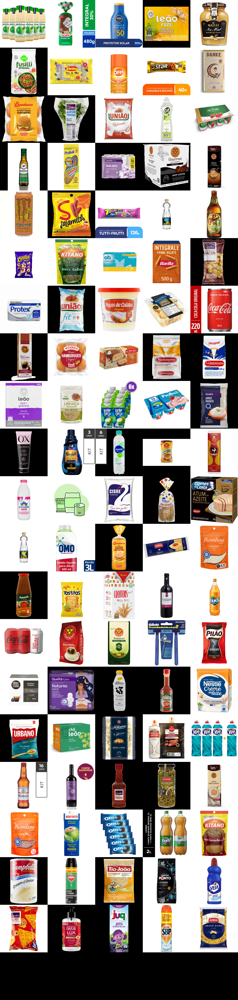

In [36]:
mosaic(best_cart)